In [2]:
import numpy as np

In [3]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer("all-MiniLM-L6-v2")

# Our sentences to encode
sentences = [
    "This framework generates embeddings for each input sentence",
    "Sentences are passed as a list of string.",
    "The quick brown fox jumps over the lazy dog."
]

# Sentences are encoded by calling model.encode()
embeddings = model.encode(sentences)

# Print the embeddings
for sentence, embedding in zip(sentences, embeddings):
    print("Sentence:", sentence)
    print("Embedding:", embedding)
    print("")

c:\Users\mrinm\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Sentence: This framework generates embeddings for each input sentence
Embedding: [-1.37173692e-02 -4.28515822e-02 -1.56286228e-02  1.40537275e-02
  3.95537838e-02  1.21796295e-01  2.94333231e-02 -3.17524225e-02
  3.54960114e-02 -7.93140009e-02  1.75878741e-02 -4.04369459e-02
  4.97259796e-02  2.54912712e-02 -7.18699917e-02  8.14968571e-02
  1.47075264e-03  4.79627997e-02 -4.50336300e-02 -9.92174968e-02
 -2.81769559e-02  6.45045862e-02  4.44670469e-02 -4.76217717e-02
 -3.52952033e-02  4.38671820e-02 -5.28565943e-02  4.33004927e-04
  1.01921484e-01  1.64072644e-02  3.26997042e-02 -3.45986970e-02
  1.21339401e-02  7.94871300e-02  4.58340021e-03  1.57778692e-02
 -9.68205743e-03  2.87625752e-02 -5.05807027e-02 -1.55794024e-02
 -2.87906863e-02 -9.62280016e-03  3.15556079e-02  2.27349699e-02
  8.71449932e-02 -3.85027602e-02 -8.84718373e-02 -8.75496864e-03
 -2.12343670e-02  2.08924040e-02 -9.02078152e-02 -5.25732264e-02
 -1.05638923e-02  2.88311318e-02 -1.61455013e-02  6.17840420e-03
 -1.23234

In [4]:
from scipy.cluster.hierarchy import linkage, dendrogram

In [5]:
import pandas as pd

In [6]:
df1 = pd.read_csv('sdoh.csv', encoding='windows-1254')

In [7]:
df1

,Domain,Topic,Data Source,Variable Name,Variable Label,Relevance and importance,County 2009,County 2010,County 2011,County 2012,...,Census Tract 2011,Census Tract 2012,Census Tract 2013,Census Tract 2014,Census Tract 2015,Census Tract 2016,Census Tract 2017,Census Tract 2018,Census Tract 2019,Census Tract 2020
0,1. Social context,Demographics,ACS,ACS_AVG_HH_SIZE,Average household size,NaN,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
1,2. Economic context,Income,ACS,ACS_GINI_INDEX,Gini index of income inequality,Inequality may indicate higher stress in the n...,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
2,2. Economic context,Income,ACS,ACS_MDN_GRNDPRNT_INC,Median income of grandparent householder and/o...,NaN,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
3,2. Economic context,Income,ACS,ACS_MDN_GRNDPRNT_NO_PRNT_INC,Median income of grandparent householder and/o...,NaN,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
4,4. Physical infrastructure,Housing,ACS,ACS_MDN_OWNER_COST_MORTGAGE,Median selected monthly owner costs for houses...,NaN,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1400,6. Geography,NaN,NaN,TRACTFIPS,State-county-census tract FIPS Code (11-digit),NaN,NaN,NaN,NaN,NaN,...,X,X,X,X,X,X,X,X,X,X
1401,4. Physical infrastructure,Environment,WUSTL,WUSTL_AVG_PM25,Annual mean of Particulate Matter (PM2.5) conc...,NaN,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
1402,Identifier,NaN,NaN,YEAR,SDOH file year,NaN,X,X,X,X,...,X,X,X,X,X,X,X,X,X,X
1403,6. Geography,NaN,NaN,ZCTA,"ZIP Code Tabulation Area, 5-digits",NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

words = ['age', 'population', 'male', 'female', 'gender']
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(words)

In [9]:
cosine_similarities = cosine_similarity(tfidf_matrix)
Z = linkage(cosine_similarities, 'ward')

In [10]:
Z

array([[0.        , 1.        , 1.41421356, 2.        ],
       [2.        , 5.        , 1.41421356, 3.        ],
       [3.        , 6.        , 1.41421356, 4.        ],
       [4.        , 7.        , 1.41421356, 5.        ]])

In [11]:
from sentence_transformers import SentenceTransformer, util

model2 = SentenceTransformer('paraphrase-MiniLM-L6-v2')  # multi-language model

sentences = [
    'median age of female population',
    'age'
]

In [12]:
embedding = model2.encode(df1['Variable Label'], convert_to_tensor=False)
embedding.shape

(1405, 384)

In [13]:
cosine_scores = util.cos_sim(embedding, embedding)

d = {}
for i, v1 in enumerate(sentences):
    for j, v2 in enumerate(sentences):
        if i >= j:
            continue
        d[v1 + ' vs. ' + v2] = cosine_scores[i][j].item()

# sort by score
d_sorted = dict(sorted(d.items(), key=lambda x: x[1], reverse=True))
d_sorted

cosine_scores.shape

torch.Size([1405, 1405])

In [14]:
cosine_scores

tensor([[1.0000, 0.3567, 0.4825,  ..., 0.0182, 0.1983, 0.1621],
        [0.3567, 1.0000, 0.3973,  ..., 0.1210, 0.1852, 0.1621],
        [0.4825, 0.3973, 1.0000,  ..., 0.0807, 0.0908, 0.0951],
        ...,
        [0.0182, 0.1210, 0.0807,  ..., 1.0000, 0.0042, 0.0166],
        [0.1983, 0.1852, 0.0908,  ..., 0.0042, 1.0000, 0.8519],
        [0.1621, 0.1621, 0.0951,  ..., 0.0166, 0.8519, 1.0000]])

In [15]:
Z = linkage(cosine_scores, 'ward')

In [16]:
Z

array([[6.78000000e+02, 6.79000000e+02, 0.00000000e+00, 2.00000000e+00],
       [6.80000000e+02, 1.40500000e+03, 0.00000000e+00, 3.00000000e+00],
       [1.15900000e+03, 1.16300000e+03, 1.69005100e-01, 2.00000000e+00],
       ...,
       [2.80300000e+03, 2.80400000e+03, 8.05695562e+01, 7.91000000e+02],
       [2.80000000e+03, 2.80500000e+03, 9.84487242e+01, 6.14000000e+02],
       [2.80600000e+03, 2.80700000e+03, 1.43158566e+02, 1.40500000e+03]])

In [17]:
Z.shape

(1404, 4)

In [18]:
variables = df1['Variable Label'].to_list()

In [19]:
import matplotlib.pyplot as plt

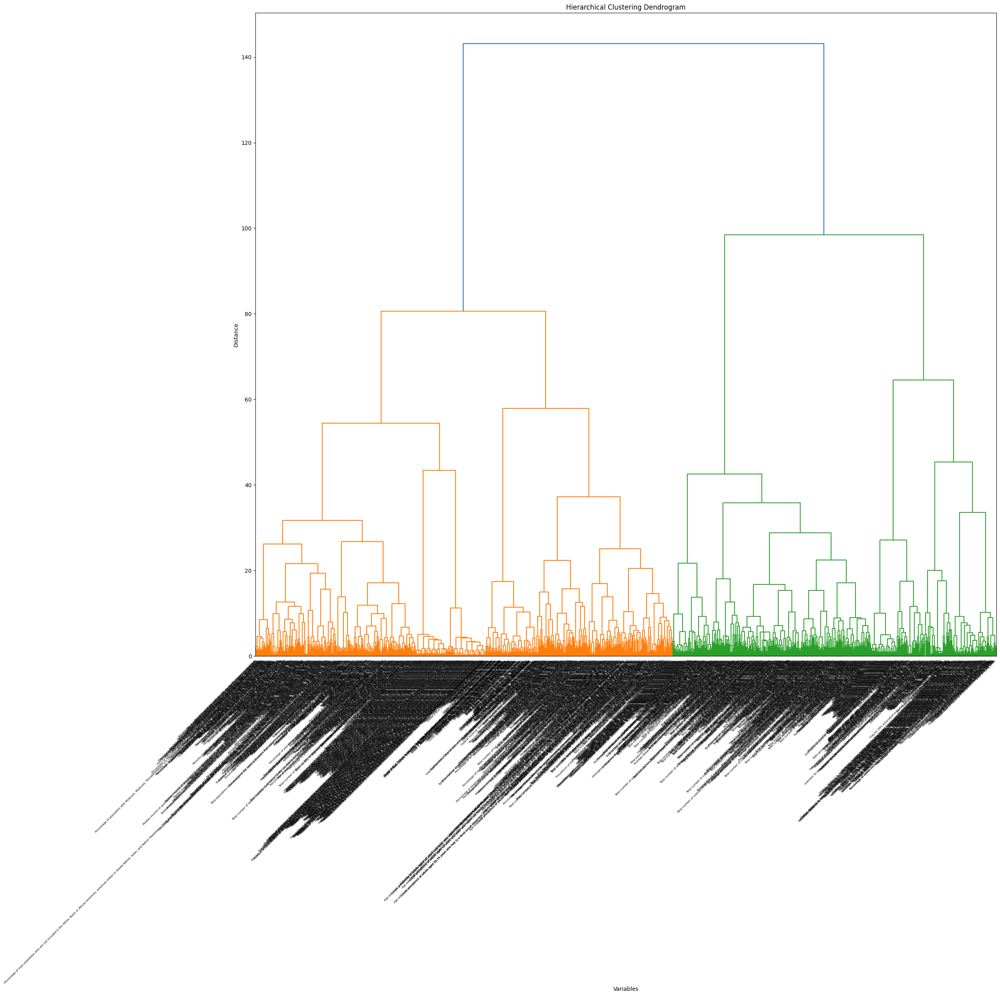

In [20]:

plt.figure(figsize=(25, 25))
dendrogram(Z, labels=variables)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Variables')
plt.ylabel('Distance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [21]:
from scipy.cluster.hierarchy import fcluster

clusters = fcluster(Z, t=40, criterion='distance')

In [22]:
clusters.shape

(1405,)

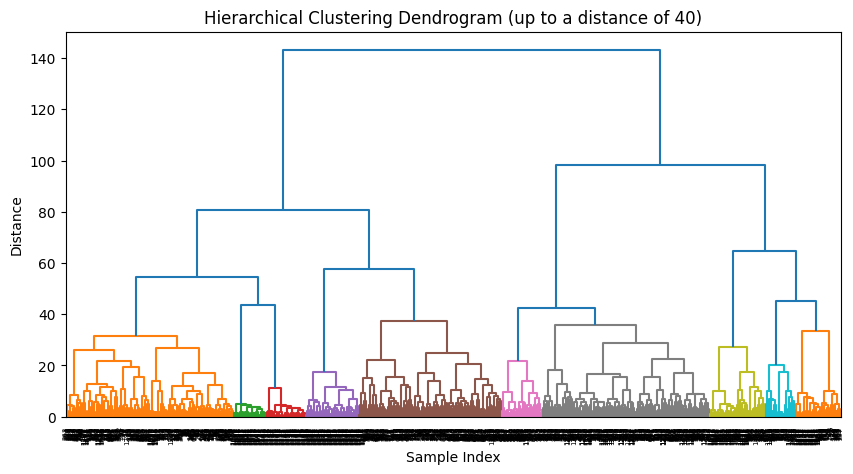

In [23]:
plt.figure(figsize=(10, 5))
dendrogram(Z, color_threshold=40)
plt.title('Hierarchical Clustering Dendrogram (up to a distance of {})'.format(40))
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

In [24]:
for i in np.unique(clusters):
    print(i)
    for j in range(clusters.shape[0]):
        if i==clusters[j]:
            print(variables[j])
    print()
    print()
    print()

1
Median income of grandparent householder and/or spouse responsible for grandchildren under 18 (dollars, inflation-adjusted to data file year)
Median income of grandparent householder and/or spouse responsible for grandchildren under 18 and no parent present (dollars, inflation-adjusted to data file year)
Median age of total population
Median age of female population
Median age of male population
Median household income (dollars, inflation-adjusted to data file year)
Median household income for households with an American Indian and Alaska Native alone householder (dollars, inflation-adjusted to data file year)
Median household income for households with an Asian alone householder (dollars, inflation-adjusted to data file year)
Median household income for households with a Black or African American alone householder (dollars, inflation-adjusted to data file year)
Median household income for households with a Hispanic or Latino householder (dollars, inflation-adjusted to data file year

In [25]:
stopwords = ['median', 'percentage', 'of', 'between', 'and', 'population', 'households', 'household', 'with', 'who', 'total', 'number', 'fraction',
             'on', 'probability', 'the', 'top', 'quintile', 'national', 'distribution', 'mean', 'scale', 'sample', 'adults', 'students',
             'per', 'capita', 'average', 'percentile', 'monthly', 'maximum', 'minimum']
var = []

for word in variables:
    querywords = word.split()
    resultwords  = [x for x in querywords if x.lower() not in stopwords]
    result = ' '.join(resultwords)
    var.append(result)


In [26]:
embedding = model2.encode(var, convert_to_tensor=False)
embedding.shape

(1405, 384)

In [27]:
cosine_scores = util.cos_sim(embedding, embedding)

d = {}
for i, v1 in enumerate(sentences):
    for j, v2 in enumerate(sentences):
        if i >= j:
            continue
        d[v1 + ' vs. ' + v2] = cosine_scores[i][j].item()

In [28]:
Z = linkage(cosine_scores, 'ward')

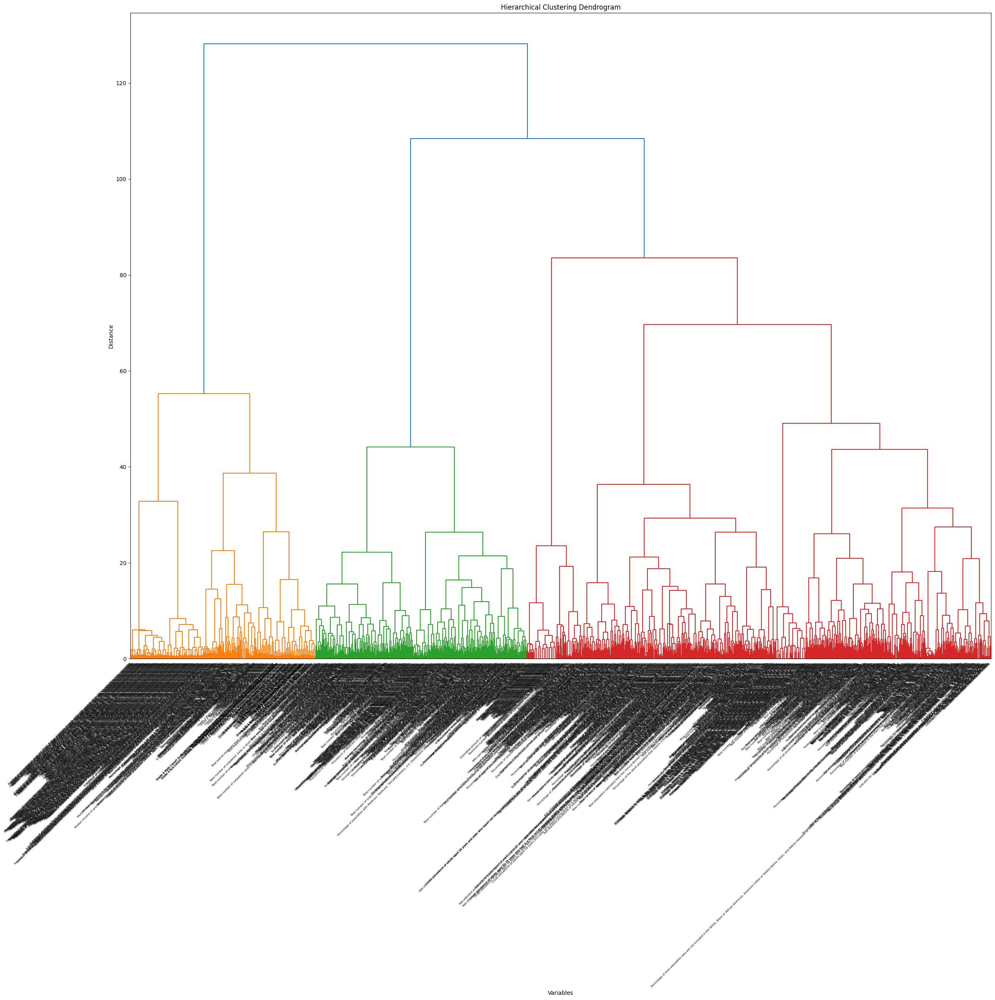

In [29]:
plt.figure(figsize=(25, 25))
dendrogram(Z, labels=variables)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Variables')
plt.ylabel('Distance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [30]:
clusters = fcluster(Z, t=30, criterion='distance')

In [31]:
for i in np.unique(clusters):
    print(i)
    for j in range(clusters.shape[0]):
        if i==clusters[j]:
            print(var[j])
    print()
    print()
    print()

1
incarcerated April 1st 2010: Asian female child parents from 100th income
incarcerated April 1st 2010: Asian female child parents from 1st income
incarcerated April 1st 2010: Asian female child parents from 25th income
incarcerated April 1st 2010: Asian female child parents from 50th income
incarcerated April 1st 2010: Asian female child parents from 75th income
incarcerated April 1st 2010: Asian male child parents from 100th income
incarcerated April 1st 2010: Asian male child parents from 1st income
incarcerated April 1st 2010: Asian male child parents from 25th income
incarcerated April 1st 2010: Asian male child parents from 50th income
incarcerated April 1st 2010: Asian male child parents from 75th income
incarcerated April 1st 2010: Black or African American female child parents from 100th income
incarcerated April 1st 2010: Black or African American female child parents from 1st income
incarcerated April 1st 2010: Black or African American female child parents from 25th income

In [32]:
wor = []

for word in variables:
    querywords = word.split()
    #resultwords  = [x for x in querywords if x.lower() not in stopwords]
    #result = ' '.join(resultwords)
    for x in querywords:
        wor.append(x)

In [33]:
from collections import Counter

cou = Counter(wor)
freq = []
for x in range(len(list(cou.keys()))):
    if list(cou.values())[x] >= 60:
        freq.append(list(cou.keys())[x])

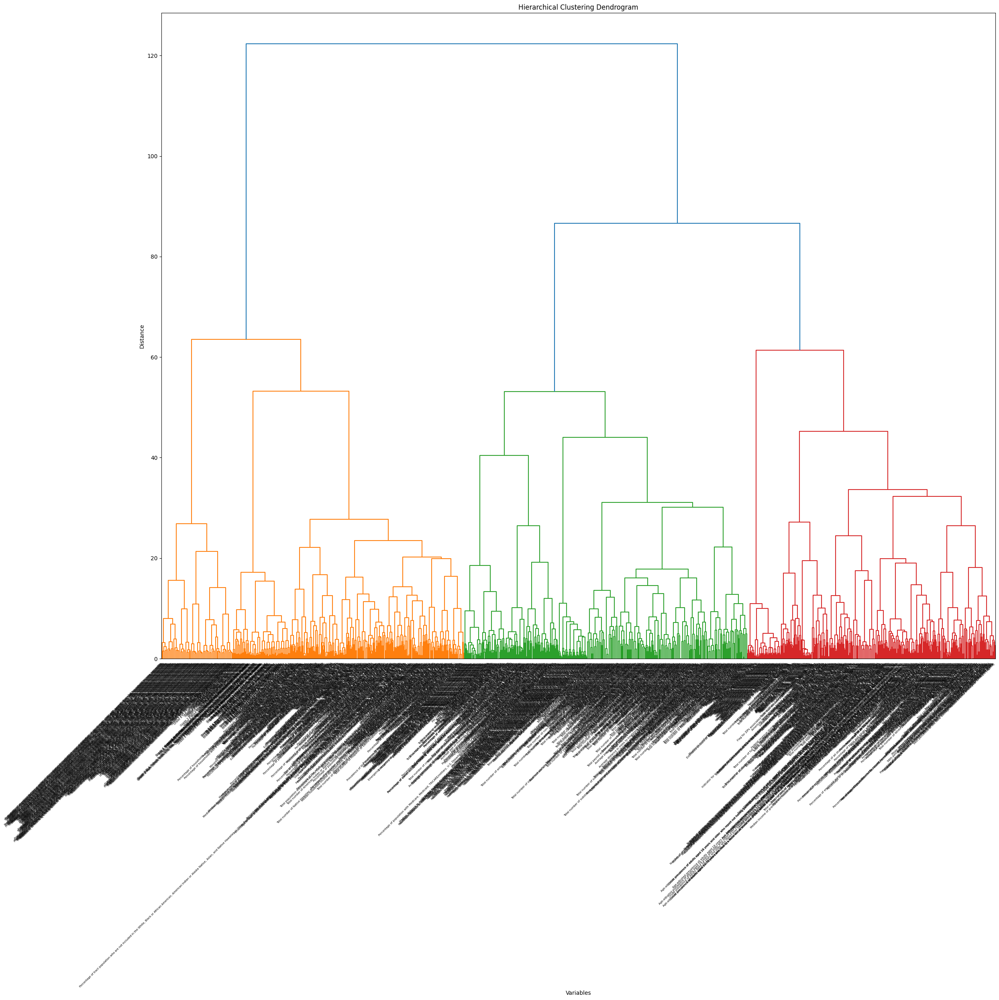

In [34]:
var1 = []

for word in variables:
    querywords = word.split()
    resultwords  = [x for x in querywords if x.lower() not in freq]
    result = ' '.join(resultwords)
    var1.append(result)

embedding = model2.encode(var1, convert_to_tensor=False)
#embedding.shape

cosine_scores = util.cos_sim(embedding, embedding)

d = {}
for i, v1 in enumerate(sentences):
    for j, v2 in enumerate(sentences):
        if i >= j:
            continue
        d[v1 + ' vs. ' + v2] = cosine_scores[i][j].item()

Z = linkage(cosine_scores, 'ward')

plt.figure(figsize=(25, 25))
dendrogram(Z, labels=variables)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Variables')
plt.ylabel('Distance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [35]:
clusters = fcluster(Z, t=40, criterion='distance')

for i in np.unique(clusters):
    print(i)
    for j in range(clusters.shape[0]):
        if i==clusters[j]:
            print(variables[j])
    print()
    print()
    print()

1
Fraction incarcerated on April 1st 2010: Asian female child with parents from 100th household income percentile
Fraction incarcerated on April 1st 2010: Asian female child with parents from 1st household income percentile
Fraction incarcerated on April 1st 2010: Asian female child with parents from 25th household income percentile
Fraction incarcerated on April 1st 2010: Asian female child with parents from 50th household income percentile
Fraction incarcerated on April 1st 2010: Asian female child with parents from 75th household income percentile
Fraction incarcerated on April 1st 2010: Asian male child with parents from 100th household income percentile
Fraction incarcerated on April 1st 2010: Asian male child with parents from 1st household income percentile
Fraction incarcerated on April 1st 2010: Asian male child with parents from 25th household income percentile
Fraction incarcerated on April 1st 2010: Asian male child with parents from 50th household income percentile
Fractio

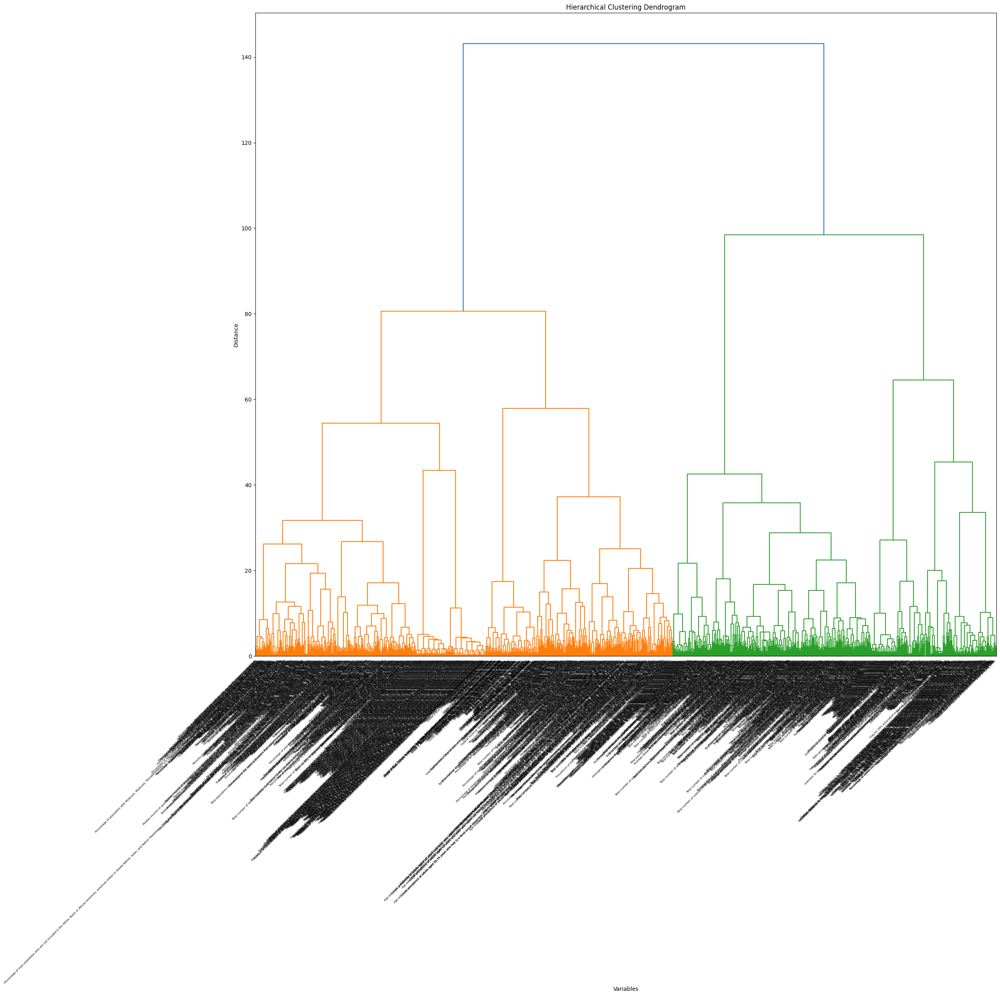

1
Percentage of population with other health insurance coverage combinations
Percentage of population with any private health insurance coverage
Percentage of population with other private-only health insurance combinations
Percentage of population with direct-purchase health insurance only
Percentage of population with other public-only health insurance combinations
Percentage of population with no health insurance coverage



2
Percentage of population with any private health insurance coverage (ages 64 and below)
Percentage of population with employer-based health insurance only (ages 64 and below)
Percentage of population with other private-only health insurance combinations (ages 64 and below)
Percentage of population with direct-purchase health insurance only (ages 64 and below)
Percentage of population with other public-only health insurance combinations (ages 64 and below)
Percentage of population with no health insurance (ages 64 and below)



3
Percentage of population with a

In [43]:
embedding = model2.encode(variables, convert_to_tensor=False)
#embedding.shape

cosine_scores = util.cos_sim(embedding, embedding)

d = {}
for i, v1 in enumerate(sentences):
    for j, v2 in enumerate(sentences):
        if i >= j:
            continue
        d[v1 + ' vs. ' + v2] = cosine_scores[i][j].item()

Z = linkage(cosine_scores, 'ward')

plt.figure(figsize=(25, 25))
dendrogram(Z, labels=variables)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Variables')
plt.ylabel('Distance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

clusters = fcluster(Z, t=300, criterion='maxclust' )

for i in np.unique(clusters):
    print(i)
    for j in range(clusters.shape[0]):
        if i==clusters[j]:
            print(variables[j])
    print()
    print()
    print()

In [44]:
clusters

array([147,  90,  23, ..., 283, 285, 285], dtype=int32)

In [45]:
variables

['Average household size',
 'Gini index of income inequality',
 'Median income of grandparent householder and/or spouse responsible for grandchildren under 18 (dollars, inflation-adjusted to data file year)',
 'Median income of grandparent householder and/or spouse responsible for grandchildren under 18 and no parent present (dollars, inflation-adjusted to data file year)',
 'Median selected monthly owner costs for houses with a mortgage (dollars)',
 'Median selected monthly owner costs for houses without a mortgage (dollars)',
 'Median age of total population',
 'Median age of female population',
 'Median age of male population',
 'Median household income (dollars, inflation-adjusted to data file year)',
 'Median household income for households with an American Indian and Alaska Native alone householder (dollars, inflation-adjusted to data file year)',
 'Median household income for households with an Asian alone householder (dollars, inflation-adjusted to data file year)',
 'Median ho

In [46]:
df1['Cluster'] = clusters

In [48]:
df1.to_csv('sdoh_clustered.csv', index=False)

* American Indian / Alaska Native / Native American
* Asian
* Black / African
* Hispanic / Latino
* 2 or more races / Multiracial
* Native Hawaiian / Pacific Islander
* Other
* White 


In [2]:
import pandas as pd
import numpy as np
df2 = pd.read_csv('dataset/health.csv')

In [3]:
len(df2['Measure'].unique())

37

In [4]:
df2.columns

Index(['Year', 'StateAbbr', 'StateDesc', 'CountyName', 'CountyFIPS',
       'LocationName', 'DataSource', 'Category', 'Measure', 'Data_Value_Unit',
       'Data_Value_Type', 'Data_Value', 'Data_Value_Footnote_Symbol',
       'Data_Value_Footnote', 'Low_Confidence_Limit', 'High_Confidence_Limit',
       'TotalPopulation', 'Geolocation', 'LocationID', 'CategoryID',
       'MeasureId', 'DataValueTypeID', 'Short_Question_Text'],
      dtype='object')

In [5]:
len(df2['CountyFIPS'].unique())

3142

In [6]:
df2

,Year,StateAbbr,StateDesc,CountyName,CountyFIPS,LocationName,DataSource,Category,Measure,Data_Value_Unit,...,Data_Value_Footnote,Low_Confidence_Limit,High_Confidence_Limit,TotalPopulation,Geolocation,LocationID,CategoryID,MeasureId,DataValueTypeID,Short_Question_Text
0,2021,AL,Alabama,Baldwin,1003,1003011300,BRFSS,Health Outcomes,Obesity among adults aged >=18 years,%,...,NaN,29.8,40.9,4487,POINT (-87.87730464 30.43411562),1003011300,HLTHOUT,OBESITY,CrdPrv,Obesity
1,2021,AL,Alabama,Chambers,1017,1017954000,BRFSS,Health Outcomes,Obesity among adults aged >=18 years,%,...,NaN,38.0,54.3,6669,POINT (-85.46010298 32.86128629),1017954000,HLTHOUT,OBESITY,CrdPrv,Obesity
2,2021,AL,Alabama,Cleburne,1029,1029959600,BRFSS,Health Outcomes,Obesity among adults aged >=18 years,%,...,NaN,31.0,47.8,4202,POINT (-85.56228862 33.69258271),1029959600,HLTHOUT,OBESITY,CrdPrv,Obesity
3,2021,AL,Alabama,Covington,1039,1039962000,BRFSS,Health Outcomes,Stroke among adults aged >=18 years,%,...,NaN,3.8,4.6,3917,POINT (-86.4651625 31.34674334),1039962000,HLTHOUT,STROKE,CrdPrv,Stroke
4,2021,AL,Alabama,Fayette,1057,1057020400,BRFSS,Health Outcomes,Obesity among adults aged >=18 years,%,...,NaN,28.4,44.1,3550,POINT (-87.60702531 33.64745531),1057020400,HLTHOUT,OBESITY,CrdPrv,Obesity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2555108,2021,WI,Wisconsin,Waukesha,55133,55133203101,BRFSS,Health Outcomes,Depression among adults aged >=18 years,%,...,NaN,17.0,23.5,6536,POINT (-88.27895206 43.04127835),55133203101,HLTHOUT,DEPRESSION,CrdPrv,Depression
2555109,2021,WY,Wyoming,Laramie,56021,56021001901,BRFSS,Health Outcomes,Depression among adults aged >=18 years,%,...,NaN,17.2,23.1,4891,POINT (-104.6678895 41.43479963),56021001901,HLTHOUT,DEPRESSION,CrdPrv,Depression
2555110,2021,WY,Wyoming,Laramie,56021,56021001501,BRFSS,Health Outcomes,Chronic obstructive pulmonary disease among ad...,%,...,NaN,5.3,7.0,4765,POINT (-104.748713 41.18131941),56021001501,HLTHOUT,COPD,CrdPrv,COPD
2555111,2021,WI,Wisconsin,Waushara,55137,55137960400,BRFSS,Prevention,Taking medicine for high blood pressure contro...,%,...,NaN,76.9,83.7,3456,POINT (-89.48341388 44.06856363),55137960400,PREVENT,BPMED,CrdPrv,Taking BP Medication


In [7]:
df4 = pd.DataFrame(columns=df2['Measure'].unique())

In [8]:
df4.insert(0, 'CountyFIPS', True)
df4.shape

(0, 38)

In [9]:
fips = df2['CountyFIPS'].unique()

for i in range(20):
    df4.loc[i,'CountyFIPS'] = fips[i]
    for j in range(1,38):
        dfr = df2[(df2['CountyFIPS']==fips[i]) & (df2['Measure']==df4.columns[j])]
        df4.loc[i,df4.columns[j]] = dfr['Data_Value'].mean()
    print(fips[i])
    

1003
1017
1029
1039
1057
1069
1073
1077
1079
1083
1095
1101
1111
1115
1121
2020
4003
4005
4013
4019


In [10]:
df4['CountyFIPS'].unique()

array([1003, 1017, 1029, 1039, 1057, 1069, 1073, 1077, 1079, 1083, 1095,
       1101, 1111, 1115, 1121, 2020, 4003, 4005, 4013, 4019], dtype=object)

In [12]:
df3 = pd.read_csv('dataset/county2020.csv', encoding='windows-1254')

In [ ]:
len(df3['COUNTYFIPS'].unique())

3229

In [32]:
df3

,YEAR,COUNTYFIPS,STATEFIPS,STATE,COUNTY,REGION,TERRITORY,ACS_TOT_POP_WT,ACS_TOT_POP_US_ABOVE1,ACS_TOT_POP_ABOVE5,...,POS_TOT_HOSP_AMBULANCE,POS_HOSP_AMBULANCE_RATE,POS_TOT_HOSP_CHEMO,POS_HOSP_CHEMO_RATE,POS_TOT_HOSP_ED,POS_HOSP_ED_RATE,POS_PCT_HOSP_FOR_PROFIT,POS_PCT_HOSP_NON_PROFIT,POS_PCT_HOSP_GOV,CEN_AIAN_NH_IND
0,2020,1001,1,Alabama,Autauga County,South,0,55639.0,54929.0,52404.0,...,0.0,0.00,0.0,0.0,1.0,0.02,52.63,36.84,10.53,0.0
1,2020,1003,1,Alabama,Baldwin County,South,0,218289.0,216518.0,206329.0,...,0.0,0.00,1.0,0.0,4.0,0.02,63.49,36.51,0.00,0.0
2,2020,1005,1,Alabama,Barbour County,South,0,25026.0,24792.0,23694.0,...,0.0,0.00,0.0,0.0,1.0,0.04,68.75,25.00,6.25,0.0
3,2020,1007,1,Alabama,Bibb County,South,0,22374.0,22073.0,21121.0,...,1.0,0.04,0.0,0.0,1.0,0.04,46.15,30.77,23.08,0.0
4,2020,1009,1,Alabama,Blount County,South,0,57755.0,57164.0,54250.0,...,0.0,0.00,0.0,0.0,1.0,0.02,60.00,40.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3224,2020,72151,72,Puerto Rico,Yabucoa Municipio,NaN,1,32867.0,NaN,31669.0,...,0.0,0.00,0.0,0.0,0.0,0.00,100.00,0.00,0.00,0.0
3225,2020,72153,72,Puerto Rico,Yauco Municipio,NaN,1,34501.0,NaN,33194.0,...,0.0,0.00,0.0,0.0,1.0,0.03,66.67,33.33,0.00,0.0
3226,2020,78010,78,US Virgin Islands,St. Croix,NaN,1,NaN,NaN,NaN,...,0.0,0.00,0.0,0.0,1.0,0.00,57.14,42.86,0.00,0.0
3227,2020,78020,78,US Virgin Islands,St. John Island,NaN,1,NaN,NaN,NaN,...,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0


In [30]:
df5 = df3[df3['COUNTYFIPS'].isin(df4['CountyFIPS'].unique())]

In [31]:
df5.drop(columns=['STATE','COUNTY','REGION'], inplace=True)
df5

C:\Users\Dell\AppData\Local\Temp\ipykernel_21636\1915831445.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5.drop(columns=['STATE','COUNTY','REGION'], inplace=True)


,YEAR,COUNTYFIPS,STATEFIPS,TERRITORY,ACS_TOT_POP_WT,ACS_TOT_POP_US_ABOVE1,ACS_TOT_POP_ABOVE5,ACS_TOT_POP_ABOVE15,ACS_TOT_POP_ABOVE16,ACS_TOT_POP_16_19,...,POS_TOT_HOSP_AMBULANCE,POS_HOSP_AMBULANCE_RATE,POS_TOT_HOSP_CHEMO,POS_HOSP_CHEMO_RATE,POS_TOT_HOSP_ED,POS_HOSP_ED_RATE,POS_PCT_HOSP_FOR_PROFIT,POS_PCT_HOSP_NON_PROFIT,POS_PCT_HOSP_GOV,CEN_AIAN_NH_IND
1,2020,1003,1,0,218289.0,216518.0,206329.0,179599.0,176852.0,10258.0,...,0.0,0.0,1.0,0.00,4.0,0.02,63.49,36.51,0.00,0.0
8,2020,1017,1,0,33427.0,33098.0,31443.0,27652.0,27270.0,1374.0,...,0.0,0.0,0.0,0.00,2.0,0.06,70.00,25.00,5.00,0.0
14,2020,1029,1,0,14952.0,14830.0,14064.0,12153.0,11967.0,674.0,...,0.0,0.0,0.0,0.00,1.0,0.07,50.00,25.00,25.00,0.0
19,2020,1039,1,0,37096.0,36554.0,34957.0,30432.0,29930.0,1698.0,...,0.0,0.0,0.0,0.00,4.0,0.11,51.85,48.15,0.00,1.0
28,2020,1057,1,0,16406.0,16156.0,15484.0,13608.0,13446.0,918.0,...,0.0,0.0,0.0,0.00,1.0,0.06,45.45,27.27,27.27,0.0
34,2020,1069,1,0,105319.0,104014.0,98813.0,85332.0,83728.0,4938.0,...,0.0,0.0,2.0,0.02,2.0,0.02,63.64,33.33,3.03,1.0
36,2020,1073,1,0,658615.0,650370.0,616321.0,532758.0,525182.0,33375.0,...,0.0,0.0,7.0,0.01,16.0,0.02,67.16,29.52,3.32,0.0
38,2020,1077,1,0,92870.0,92255.0,88122.0,77769.0,76481.0,4752.0,...,0.0,0.0,1.0,0.01,3.0,0.03,52.38,40.48,7.14,0.0
39,2020,1079,1,0,32969.0,32658.0,31194.0,27011.0,26712.0,1573.0,...,0.0,0.0,0.0,0.00,1.0,0.03,46.15,38.46,15.38,1.0
41,2020,1083,1,0,96921.0,95760.0,91525.0,79255.0,77975.0,4834.0,...,0.0,0.0,0.0,0.00,2.0,0.02,50.00,45.00,5.00,0.0


In [13]:
pd.set_option('display.max_rows', 720)
df5.corr(df4)

NameError: name 'df5' is not defined

In [26]:
df7 = pd.DataFrame(columns=df2['Measure'].unique())
df7.insert(0, 'COUNTYFIPS', True)
df7.shape

(0, 38)

In [27]:
fips = df2['CountyFIPS'].unique()

for i in range(len(fips)):
    df7.loc[i,'COUNTYFIPS'] = fips[i]
    dfr = df2[(df2['CountyFIPS']==fips[i])]
    grp = dfr.groupby('Measure')
    for key in list(grp.groups.keys()):
        df7.loc[i,key] = grp.get_group(key)['Data_Value'].mean()
    #print(fips[i])

In [28]:
df7

,COUNTYFIPS,Obesity among adults aged >=18 years,Stroke among adults aged >=18 years,Arthritis among adults aged >=18 years,Mammography use among women aged 50-74 years,Depression among adults aged >=18 years,Vision disability among adults aged >=18 years,Chronic obstructive pulmonary disease among adults aged >=18 years,Visits to dentist or dental clinic among adults aged >=18 years,High cholesterol among adults aged >=18 years who have been screened in the past 5 years,...,Binge drinking among adults aged >=18 years,Fair or poor self-rated health status among adults aged >=18 years,Current asthma among adults aged >=18 years,Visits to doctor for routine checkup within the past year among adults aged >=18 years,Cognitive disability among adults ages >=18 years,Hearing disability among adults aged >=18 years,Diagnosed diabetes among adults aged >=18 years,"Older adult men aged >=65 years who are up to date on a core set of clinical preventive services: Flu shot past year, PPV shot ever, Colorectal cancer screening",Physical health not good for >=14 days among adults aged >=18 years,Coronary heart disease among adults aged >=18 years
0,1003,38.158065,3.329032,31.293548,77.829032,22.567742,4.622581,7.996774,64.974194,37.932258,...,16.025806,17.412903,9.929032,74.890323,13.387097,7.06129,12.103226,54.506452,12.422581,6.922581
1,1017,44.588889,4.555556,34.033333,77.277778,22.433333,7.333333,9.8,56.566667,38.877778,...,12.511111,24.644444,11.122222,79.255556,16.988889,7.488889,16.255556,37.922222,15.444444,8.033333
2,1029,36.7,3.75,32.75,74.875,25.475,5.875,10.0,58.9,39.175,...,14.625,21.775,10.55,75.425,16.925,7.975,12.95,40.725,14.875,7.675
3,1039,40.507143,4.185714,34.185714,74.021429,23.735714,6.578571,10.342857,56.707143,38.485714,...,13.392857,23.085714,10.807143,77.371429,16.942857,8.364286,14.35,41.478571,15.257143,8.357143
4,1057,37.48,4.2,35.0,76.2,24.34,6.68,10.76,56.2,40.5,...,13.86,23.28,10.74,76.7,17.36,8.6,14.34,42.56,15.6,8.48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56023,30.425,2.875,24.625,67.45,19.825,4.375,7.125,69.875,34.3,...,16.525,14.6,9.725,65.85,12.825,7.5,9.0,33.125,11.375,5.8
3138,56031,37.55,3.7,29.2,65.05,19.5,5.2,8.75,66.85,36.95,...,14.55,17.75,9.85,67.7,13.0,9.5,11.7,41.7,13.15,7.55
3139,56039,21.875,1.95,19.075,74.5,17.85,2.925,4.35,76.775,29.125,...,21.075,9.65,8.75,65.3,9.5,5.45,6.275,41.875,7.925,3.925
3140,56017,33.35,3.95,31.4,64.15,21.05,5.45,9.35,62.85,37.7,...,13.85,17.6,9.9,67.85,13.35,10.2,12.1,41.45,13.65,8.2


In [33]:
df_final = df7.merge(df3, on='COUNTYFIPS')

In [36]:
df_final.drop(columns=['STATE','COUNTY','REGION'], inplace=True)

In [37]:
df_final.corr()

,COUNTYFIPS,Obesity among adults aged >=18 years,Stroke among adults aged >=18 years,Arthritis among adults aged >=18 years,Mammography use among women aged 50-74 years,Depression among adults aged >=18 years,Vision disability among adults aged >=18 years,Chronic obstructive pulmonary disease among adults aged >=18 years,Visits to dentist or dental clinic among adults aged >=18 years,High cholesterol among adults aged >=18 years who have been screened in the past 5 years,...,POS_TOT_HOSP_AMBULANCE,POS_HOSP_AMBULANCE_RATE,POS_TOT_HOSP_CHEMO,POS_HOSP_CHEMO_RATE,POS_TOT_HOSP_ED,POS_HOSP_ED_RATE,POS_PCT_HOSP_FOR_PROFIT,POS_PCT_HOSP_NON_PROFIT,POS_PCT_HOSP_GOV,CEN_AIAN_NH_IND
COUNTYFIPS,1.000000e+00,0.034864,-0.042407,0.048011,0.095731,0.108805,-0.051980,-0.006192,0.082718,0.103106,...,0.054856,0.044409,-0.038073,-0.010754,-0.029125,0.025785,-0.010596,0.004095,-0.012948,0.024743
Obesity among adults aged >=18 years,3.486411e-02,1.000000,0.629409,0.476772,0.051346,0.186359,0.593494,0.612237,-0.600442,0.428242,...,-0.037472,0.000016,-0.245338,-0.040450,-0.183333,0.024947,0.041375,-0.020568,-0.008313,-0.063541
Stroke among adults aged >=18 years,-4.240703e-02,0.629409,1.000000,0.734396,-0.035044,0.127542,0.782089,0.805475,-0.648712,0.666592,...,-0.062247,0.007960,-0.246816,0.003165,-0.162704,0.198929,-0.033853,-0.029970,0.081683,0.008571
Arthritis among adults aged >=18 years,4.801117e-02,0.476772,0.734396,1.000000,-0.037456,0.322947,0.301975,0.806669,-0.306362,0.763634,...,-0.071760,0.007624,-0.330435,0.021632,-0.279941,0.159824,0.015109,-0.074517,0.051028,-0.081799
Mammography use among women aged 50-74 years,9.573090e-02,0.051346,-0.035044,-0.037456,1.000000,-0.038043,-0.006508,-0.150198,0.188198,-0.103284,...,0.009724,-0.025245,0.204432,-0.062930,0.141592,-0.221787,0.220323,-0.024903,-0.233810,-0.133931
Depression among adults aged >=18 years,1.088049e-01,0.186359,0.127542,0.322947,-0.038043,1.000000,0.225228,0.535298,-0.396001,0.151921,...,-0.050669,-0.060535,-0.109437,-0.196601,-0.076463,-0.223121,0.229673,-0.119567,-0.132145,-0.071251
Vision disability among adults aged >=18 years,-5.197989e-02,0.593494,0.782089,0.301975,-0.006508,0.225228,1.000000,0.627760,-0.841897,0.348541,...,-0.020521,0.002210,-0.090522,-0.117390,-0.015195,-0.002326,0.052299,-0.027121,-0.019827,0.001142
Chronic obstructive pulmonary disease among adults aged >=18 years,-6.192425e-03,0.612237,0.805475,0.806669,-0.150198,0.535298,0.627760,1.000000,-0.695481,0.687588,...,-0.070147,-0.015768,-0.288647,-0.066432,-0.211923,0.066410,0.075332,-0.087391,0.010955,-0.100296
Visits to dentist or dental clinic among adults aged >=18 years,8.271829e-02,-0.600442,-0.648712,-0.306362,0.188198,-0.396001,-0.841897,-0.695481,1.000000,-0.400902,...,0.015244,-0.004946,0.160275,0.143310,0.064985,0.006550,-0.057463,0.043520,0.000426,0.089042
High cholesterol among adults aged >=18 years who have been screened in the past 5 years,1.031059e-01,0.428242,0.666592,0.763634,-0.103284,0.151921,0.348541,0.687588,-0.400902,1.000000,...,-0.061920,0.018200,-0.289582,-0.023888,-0.211751,0.180737,-0.079234,-0.009600,0.099562,-0.112452
